In [1]:
import pandas as pd
import numpy as np
import os

In [5]:
os.mkdir('/kaggle/working/photos')
!wget https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/wiki_crop.tar
!tar -xvf  'wiki_crop.tar' -C '/kaggle/working/photos'

--2024-03-03 00:54:14--  https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/wiki_crop.tar
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 811315200 (774M) [application/x-tar]
Saving to: ‘wiki_crop.tar’

wiki_crop.tar       100%[===================>] 773.73M  12.8MB/s    in 62s     

2024-03-03 00:55:17 (12.5 MB/s) - ‘wiki_crop.tar’ saved [811315200/811315200]

wiki_crop/00/23804200_1950-03-31_2013.jpg
wiki_crop/00/23836900_1988-10-31_2012.jpg
wiki_crop/00/23882000_1940-06-28_2009.jpg
wiki_crop/00/3386200_1955-02-21_1994.jpg
wiki_crop/00/43806600_1991-07-27_2014.jpg
wiki_crop/00/24817400_1984-10-25_2011.jpg
wiki_crop/00/34807600_1988-05-11_2013.jpg
wiki_crop/00/3482000_1971-03-20_2005.jpg
wiki_crop/00/2581400_1954-04-17_2007.jpg
wiki_crop/00/35833400_1966-04-06_2013.jpg
wiki_cro

In [6]:
path = r"/kaggle/working/photos/wiki_crop"
faces_1 = []

# Walk through each directory in the given path
for root, dirs, files in os.walk(path):
    for file in files:
        if file.endswith('.jpg'):
            # Construct the full path to the file
            full_path = os.path.join(root, file)
            # Add it to the faces list
            faces_1.append(full_path)


# Now, 'faces' contains the paths to all the .jpg images in the subdirectories

# Prepared Folders Structure

In [7]:
df = pd.read_csv("/kaggle/input/def-images/image_ord.csv")
df.head()

,Unnamed: 0,keyss,val
0,0,19242061_1982-08-16_2009.jpg,[]
1,1,2399661_1977-09-02_2008.jpg,"[(64, 81, 218, 236)]"
2,2,9494361_1962-04-21_1994.jpg,[]
3,3,44438061_1937-11-14_1969.jpg,"[(167, 142, 390, 365)]"
4,4,37699961_1890-12-11_1947.jpg,"[(46, 64, 201, 219)]"


In [8]:
len(df[df.val != "[]"])

39229

In [9]:
filtered_df = df[df.val != "[]"]

In [10]:
images_2 = list(filtered_df.keyss)
len(images_2)

39229

In [24]:
import shutil

def merge_images(source_folder, destination_folder):
    """
    Copy all images from source_folder and its subfolders to destination_folder.
    """
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp']

    for root, dirs, files in os.walk(source_folder):
        for file in files:
            if any(file.lower().endswith(ext) for ext in image_extensions) and file in images_2:
                file_path = os.path.join(root, file)
                destination_path = os.path.join(destination_folder, file)

                if os.path.exists(destination_path):
                    print(f"File {file} already exists in the destination folder. Skipping...")
                else:
                    shutil.copy(file_path, destination_folder)
                    print(f"Copied {file} to {destination_folder}")

In [26]:
source_folder = '/kaggle/working/photos'  # Update this path
destination_folder = '/kaggle/working/frontal_photos'  # Update this path

merge_images(source_folder, destination_folder)

File 5532058_1973-03-11_2011.jpg already exists in the destination folder. Skipping...
File 36487258_1980-11-07_2012.jpg already exists in the destination folder. Skipping...
File 29791458_1987-03-01_2013.jpg already exists in the destination folder. Skipping...
File 1142258_1955-05-26_2005.jpg already exists in the destination folder. Skipping...
File 4373458_1989-03-28_2012.jpg already exists in the destination folder. Skipping...
File 1860158_1969-05-01_2014.jpg already exists in the destination folder. Skipping...
File 4506758_1889-07-13_1940.jpg already exists in the destination folder. Skipping...
File 5973258_1958-09-18_1979.jpg already exists in the destination folder. Skipping...
File 27853658_1991-12-07_2012.jpg already exists in the destination folder. Skipping...
File 15989458_1991-11-05_2010.jpg already exists in the destination folder. Skipping...
File 356058_1903-12-05_1964.jpg already exists in the destination folder. Skipping...
File 41202858_1934-06-12_1952.jpg alread

KeyboardInterrupt: 

In [16]:
import os
import random
import matplotlib.pyplot as plt

def get_all_image_paths(folder_path):
    """
    Get all image file paths from the specified folder.
    """
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp']
    image_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path)
                   if any(file.lower().endswith(ext) for ext in image_extensions)]
    return image_paths

In [27]:
folder_path = '/kaggle/working/frontal_photos'
image_files = get_all_image_paths(folder_path)

In [28]:
len(image_files)

39229

In [ ]:
len(os.listdir('/kaggle/working/frontal_photos'))

# With 9k images

In [29]:
df = pd.read_csv('/kaggle/input/def-images/9k_frontal_images.csv')
df.head()

,Unnamed: 0,Unnamed: 0.1,keyss,val,distance
0,8466,8466,1457056_1955-07-21_2012.jpg,"[-44, -44, 312, 313]",504.167631
1,48294,48294,1547179_1945-01-22_2012.jpg,"[98, 63, 419, 384]",453.962554
2,20561,20561,2164845_1946-11-01_2007.jpg,"[63, 63, 384, 384]",453.962554
3,53221,53221,16623_1902-07-28_1980.jpg,"[63, 99, 384, 420]",453.962554
4,8284,8284,11039456_1951-06-06_1990.jpg,"[98, 63, 419, 384]",453.962554


In [30]:
paths = df['keyss']
full_paths = [os.path.join('/kaggle/working/frontal_photos/', name) for name in paths]

# Prepared FaceNet-PyTorch

In [31]:
from keras.applications import MobileNetV2
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import img_to_array
from sklearn.cluster import KMeans
from tqdm import tqdm
import shutil

Using TensorFlow backend.


In [32]:
import tqdm

# Function to Extract features from the images
def image_feature(direc):
    model = MobileNetV2(weights='imagenet', include_top=False)
    features = [];
    img_name = [];
    with tqdm.tqdm(total=len(direc), desc="Extracting Features") as pbar:
        for fname in direc:
            img=image.load_img(fname, target_size=(224,224))
            x = img_to_array(img)
            x=np.expand_dims(x,axis=0)
            x=preprocess_input(x)
            feat=model.predict(x)
            feat=feat.flatten()
            features.append(feat)
            img_name.append(fname)
            pbar.update()

    return features, img_name

In [33]:
img_features, img_name = image_feature(full_paths)

Instructions for updating:
Colocations handled automatically by placer.


/opt/conda/lib/python3.6/site-packages/keras_applications/mobilenet_v2.py:295: UserWarning: MobileNet shape is undefined. Weights for input shape(224, 224) will be loaded.
  warnings.warn('MobileNet shape is undefined.'
Extracting Features: 100%|██████████| 9000/9000 [01:21<00:00, 110.71it/s]


In [34]:
k = 8
clusters = KMeans(k, random_state=42)
clusters.fit(img_features)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

In [35]:
image_cluster = pd.DataFrame(img_name,columns=['image'])
image_cluster["clusterid"] = clusters.labels_

In [36]:
image_cluster.head()

,image,clusterid
0,/kaggle/working/frontal_photos/1457056_1955-07...,3
1,/kaggle/working/frontal_photos/1547179_1945-01...,4
2,/kaggle/working/frontal_photos/2164845_1946-11...,1
3,/kaggle/working/frontal_photos/16623_1902-07-2...,0
4,/kaggle/working/frontal_photos/11039456_1951-0...,6


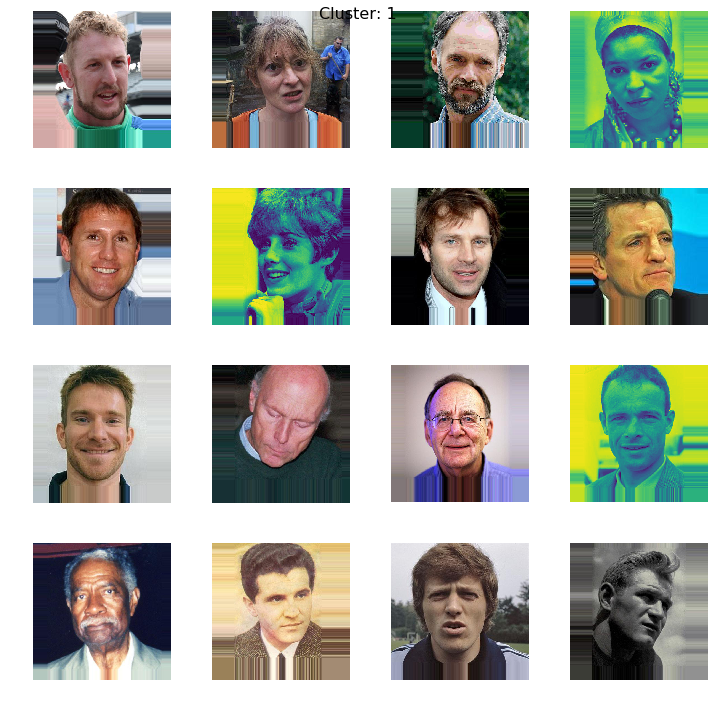

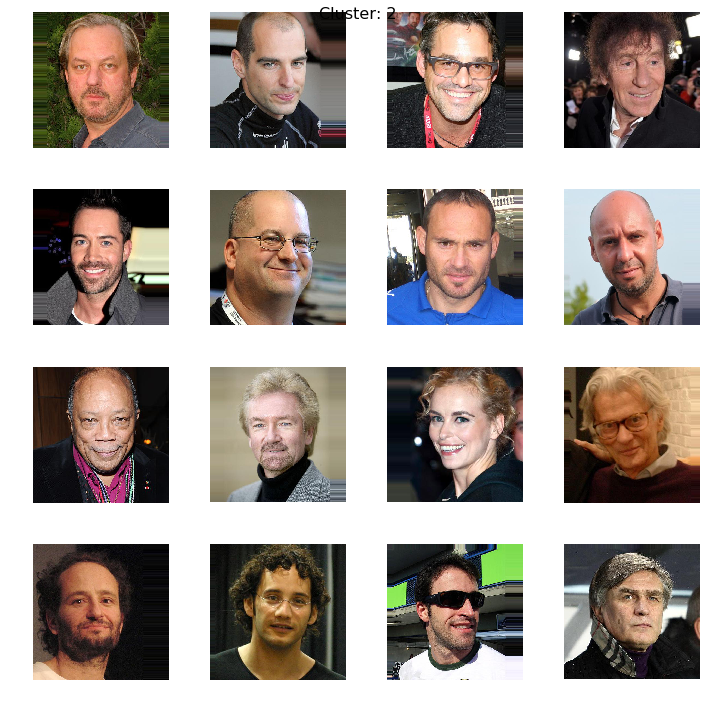

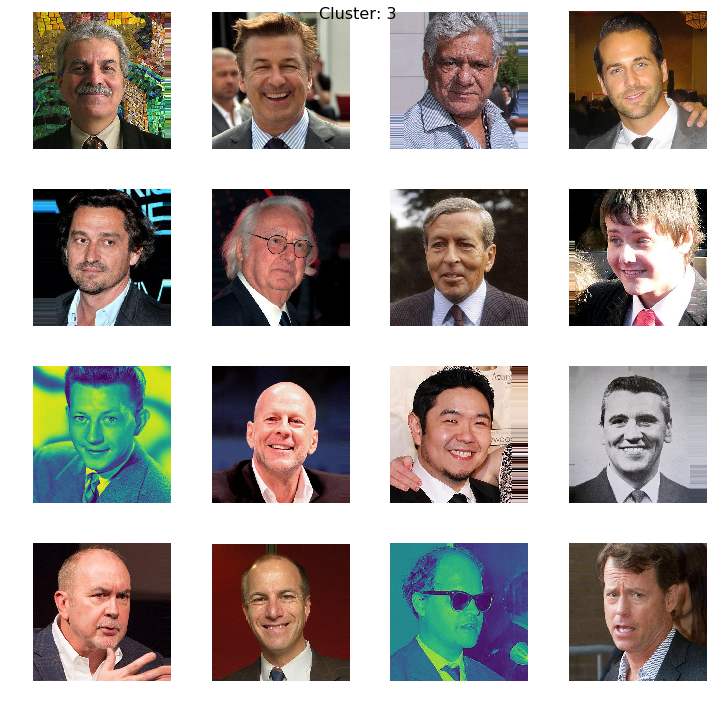

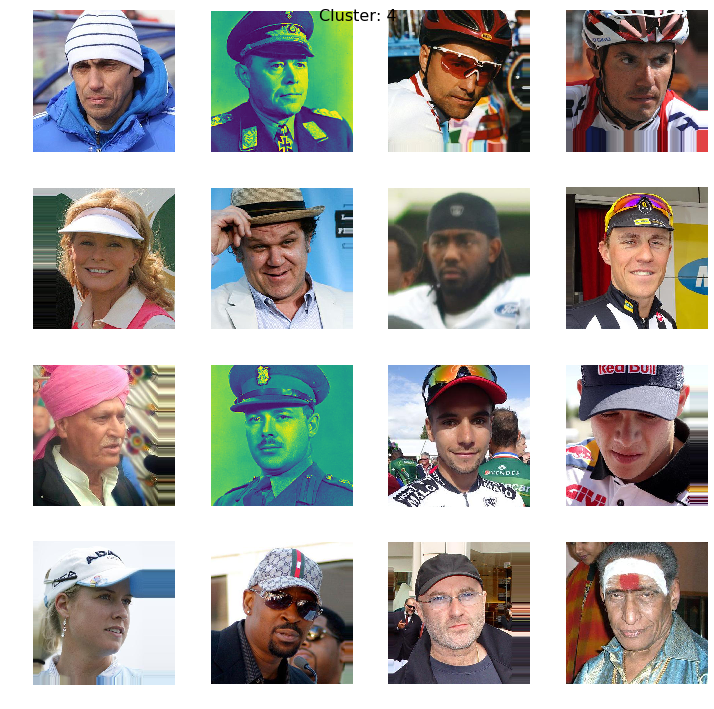

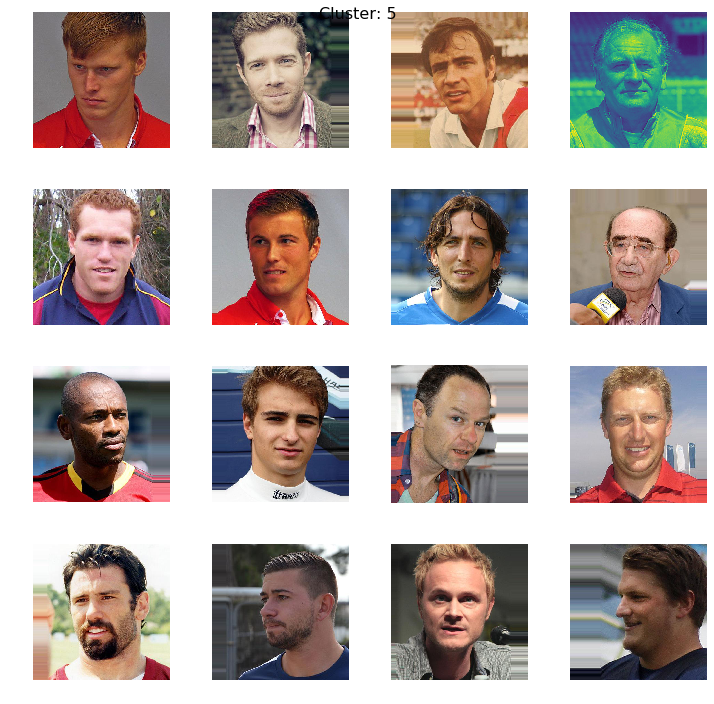

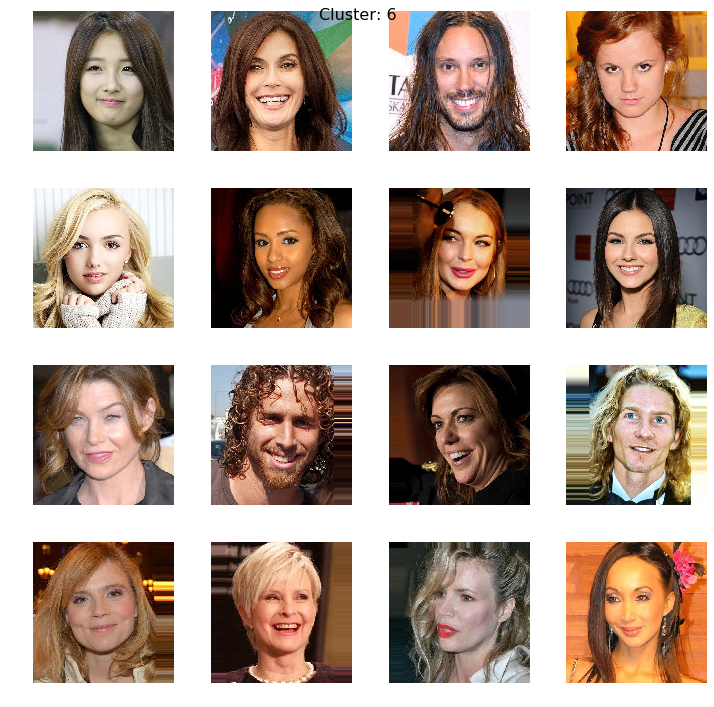

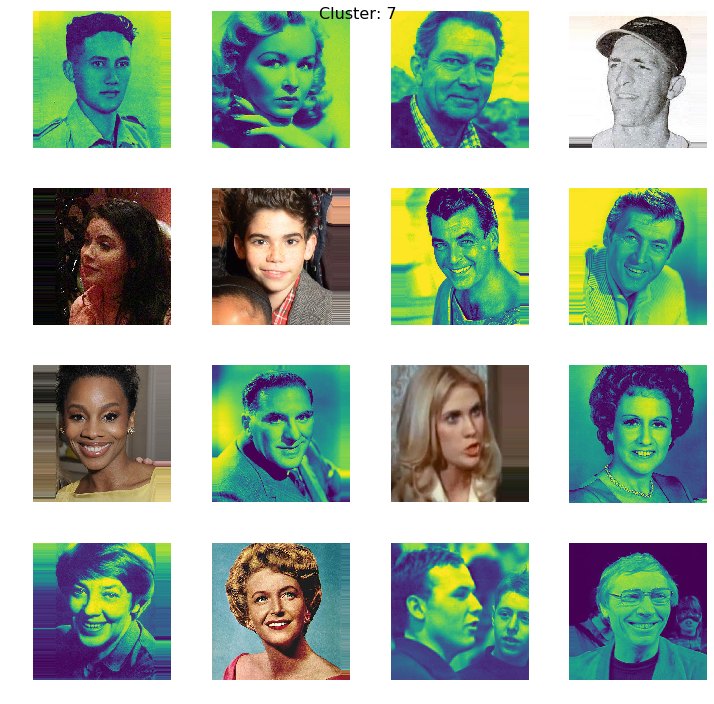

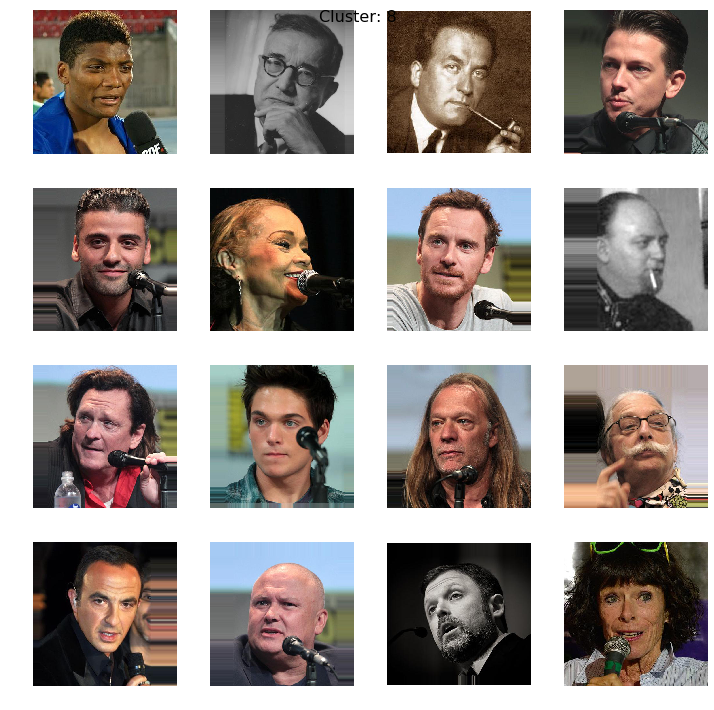

In [39]:
num_images_per_cluster = 16

cluster_groups = image_cluster.groupby("clusterid")

for cluster_name, cluster_data in cluster_groups:
    image_paths = cluster_data["image"].tolist()
    np.random.shuffle(image_paths)

    selected_images = image_paths[:num_images_per_cluster]

    fig, axes = plt.subplots(4, 4, figsize=(10, 10))
    for i, image_path in enumerate(selected_images):
        img = plt.imread(image_path)
        axes[i // 4, i % 4].imshow(img)
        axes[i // 4, i % 4].axis("off")

    fig.suptitle(f"Cluster: {cluster_name+1}", fontsize=16)
    plt.tight_layout()
    plt.show()


In [38]:
with open("features.txt", "w") as output_1:
    output_1.write(str(img_features))
    
with open("names.txt", "w") as output_2:
    output_2.write(str(img_name))

# With Cropped Images